<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Eda-and-data-discovery" data-toc-modified-id="Eda-and-data-discovery-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Eda and data discovery</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#check-for-large-number-of-NA" data-toc-modified-id="check-for-large-number-of-NA-1.0.1"><span class="toc-item-num">1.0.1&nbsp;&nbsp;</span>check for large number of NA</a></span></li></ul></li><li><span><a href="#checking-for-distributions" data-toc-modified-id="checking-for-distributions-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>checking for distributions</a></span><ul class="toc-item"><li><span><a href="#by-construction-year" data-toc-modified-id="by-construction-year-1.1.1"><span class="toc-item-num">1.1.1&nbsp;&nbsp;</span>by construction year</a></span></li><li><span><a href="#by-the-funder" data-toc-modified-id="by-the-funder-1.1.2"><span class="toc-item-num">1.1.2&nbsp;&nbsp;</span>by the funder</a></span></li><li><span><a href="#for-loop-of-box-plots" data-toc-modified-id="for-loop-of-box-plots-1.1.3"><span class="toc-item-num">1.1.3&nbsp;&nbsp;</span>for loop of box plots</a></span></li><li><span><a href="#for-loop-of-hist-plots" data-toc-modified-id="for-loop-of-hist-plots-1.1.4"><span class="toc-item-num">1.1.4&nbsp;&nbsp;</span>for loop of hist plots</a></span></li><li><span><a href="#specific-to-year" data-toc-modified-id="specific-to-year-1.1.5"><span class="toc-item-num">1.1.5&nbsp;&nbsp;</span>specific to year</a></span></li></ul></li></ul></li><li><span><a href="#start-modeling" data-toc-modified-id="start-modeling-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>start modeling</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#TRANSFORM-DATA" data-toc-modified-id="TRANSFORM-DATA-2.0.1"><span class="toc-item-num">2.0.1&nbsp;&nbsp;</span>TRANSFORM DATA</a></span></li><li><span><a href="#grid-search" data-toc-modified-id="grid-search-2.0.2"><span class="toc-item-num">2.0.2&nbsp;&nbsp;</span>grid search</a></span></li></ul></li></ul></li></ul></div>

# Eda and data discovery

In [1]:

import nbimporter
from functionForModels import run_model

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from xgboost import XGBClassifier

from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_curve, auc
from sklearn import metrics
from sklearn.metrics import plot_confusion_matrix, classification_report

from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.preprocessing import StandardScaler


In [2]:
df_preds= pd.read_csv('water_data.csv')
df_target=pd.read_csv('water_targets.csv')

In [3]:
merged_data=pd.concat([df_preds,df_target],axis=1,join='inner')

df_preds.describe()


,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.000000,59400.000000,59400.000000,59400.000000,5.940000e+04,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000
mean,37115.131768,317.650385,668.297239,34.077427,-5.706033e+00,0.474141,15.297003,5.629747,179.909983,1300.652475
std,21453.128371,2997.574558,693.116350,6.567432,2.946019e+00,12.236230,17.587406,9.633649,471.482176,951.620547
min,0.000000,0.000000,-90.000000,0.000000,-1.164944e+01,0.000000,1.000000,0.000000,0.000000,0.000000
25%,18519.750000,0.000000,0.000000,33.090347,-8.540621e+00,0.000000,5.000000,2.000000,0.000000,0.000000
50%,37061.500000,0.000000,369.000000,34.908743,-5.021597e+00,0.000000,12.000000,3.000000,25.000000,1986.000000
75%,55656.500000,20.000000,1319.250000,37.178387,-3.326156e+00,0.000000,17.000000,5.000000,215.000000,2004.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-2.000000e-08,1776.000000,99.000000,80.000000,30500.000000,2013.000000


In [4]:
df_preds.shape

(59400, 40)

### check for large number of NA

In [5]:
print(df_preds.isna().sum())
print(df_preds.isna().sum().sum())

id                           0
amount_tsh                   0
date_recorded                0
funder                    3635
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

the smaller around 4k values we can get rid off it should not mess up the distrbution

In [6]:
list(df_preds['scheme_name'].unique())

['Roman',
 nan,
 'Nyumba ya mungu pipe scheme',
 'Zingibali',
 'BL Bondeni',
 'None',
 "wanging'ombe water supply s",
 'Makanj',
 'Kidabu',
 'Mashangwi',
 'Quick wins Program',
 'Komaka mandaka',
 'Sobodo Borehole Scheme',
 'Kitukuni water supply',
 'BL Mwakikoti',
 'Chalinze wate',
 'Mae pipeline',
 'UNDP',
 'Ngana water supplied scheme',
 'Itun',
 'Bomala',
 'Kirua kahe pumping water trust',
 'Misiwa',
 'Mtwango water supplied sche',
 'K',
 'Machumba estate pipe line',
 'SHIMASA',
 'wangama water supply scheme',
 'Shirimatunda Water Supply',
 'Laela group water Supp',
 'Makwale water supplied sche',
 "Nyang'hwale",
 'Njoro Water Supply',
 'Kirua kahe gravity water supply trust',
 'Olgilai pipe line',
 'Mabula mountains spr',
 'Mkongoro One',
 'Maambreni gravity water supply',
 'Mwando water supply',
 'M',
 'Kaisho/Isingiro w',
 "wanging'ombe supply scheme",
 'Tove Mtwango gravity Scheme',
 'Tengeru gravity water supply',
 'Kulasi water supply',
 'Malemb',
 'Tawa',
 'Loruvani gravity 

In [7]:
merged_data['scheme_name']=merged_data['scheme_name'].fillna('no_scheme')
merged_data.shape

(59400, 42)

In [8]:
print(merged_data.isna().sum())

id                          0
amount_tsh                  0
date_recorded               0
funder                   3635
gps_height                  0
installer                3655
longitude                   0
latitude                    0
wpt_name                    0
num_private                 0
basin                       0
subvillage                371
region                      0
region_code                 0
district_code               0
lga                         0
ward                        0
population                  0
public_meeting           3334
recorded_by                 0
scheme_management        3877
scheme_name                 0
permit                   3056
construction_year           0
extraction_type             0
extraction_type_group       0
extraction_type_class       0
management                  0
management_group            0
payment                     0
payment_type                0
water_quality               0
quality_group               0
quantity  

the smaller around 4k values we can get rid off it should not mess up the distrbution

In [9]:
merged_data.dropna(inplace=True)
merged_data.drop(['id','longitude','latitude','waterpoint_type_group','num_private','region_code','recorded_by','scheme_name','subvillage','quantity_group','source_class','source_type','lga','payment','payment_type','management_group','ward','extraction_type_group','extraction_type_class','quality_group','date_recorded','wpt_name'],axis=1,inplace=True)

next line of code, just wanted to keep the logic as to why i got rid of some columns, jist many were repeat and some did not really have pertanent information for modeling

seperating values based of datatype for dummy creation

In [10]:
merged_data.dtypes

amount_tsh           float64
funder                object
gps_height             int64
installer             object
basin                 object
region                object
district_code          int64
population             int64
public_meeting        object
scheme_management     object
permit                object
construction_year      int64
extraction_type       object
management            object
water_quality         object
quantity              object
source                object
waterpoint_type       object
status_group          object
dtype: object

In [11]:
start_x=merged_data.drop('status_group',axis=1)
start_y=merged_data['status_group']

numb_col_only=merged_data.select_dtypes(include=[np.number]).columns
ob_col_only=merged_data.select_dtypes(include=[np.object]).columns

start_x2=start_x.select_dtypes(include=[np.number]).columns
start_y2=merged_data.select_dtypes(include=[np.object]).columns

start_x.drop(ob_col_only[:-1],axis=1)

,amount_tsh,gps_height,district_code,population,construction_year
0,6000.0,1390,5,109,1999
2,25.0,686,4,250,2009
3,0.0,263,63,58,1986
5,20.0,0,8,1,2009
6,0.0,0,3,0,0
...,...,...,...,...,...
59394,500.0,351,6,89,2007
59395,10.0,1210,5,125,1999
59396,4700.0,1212,4,56,1996
59398,0.0,0,4,0,0


## checking for distributions

### by construction year

<AxesSubplot:xlabel='construction_year'>

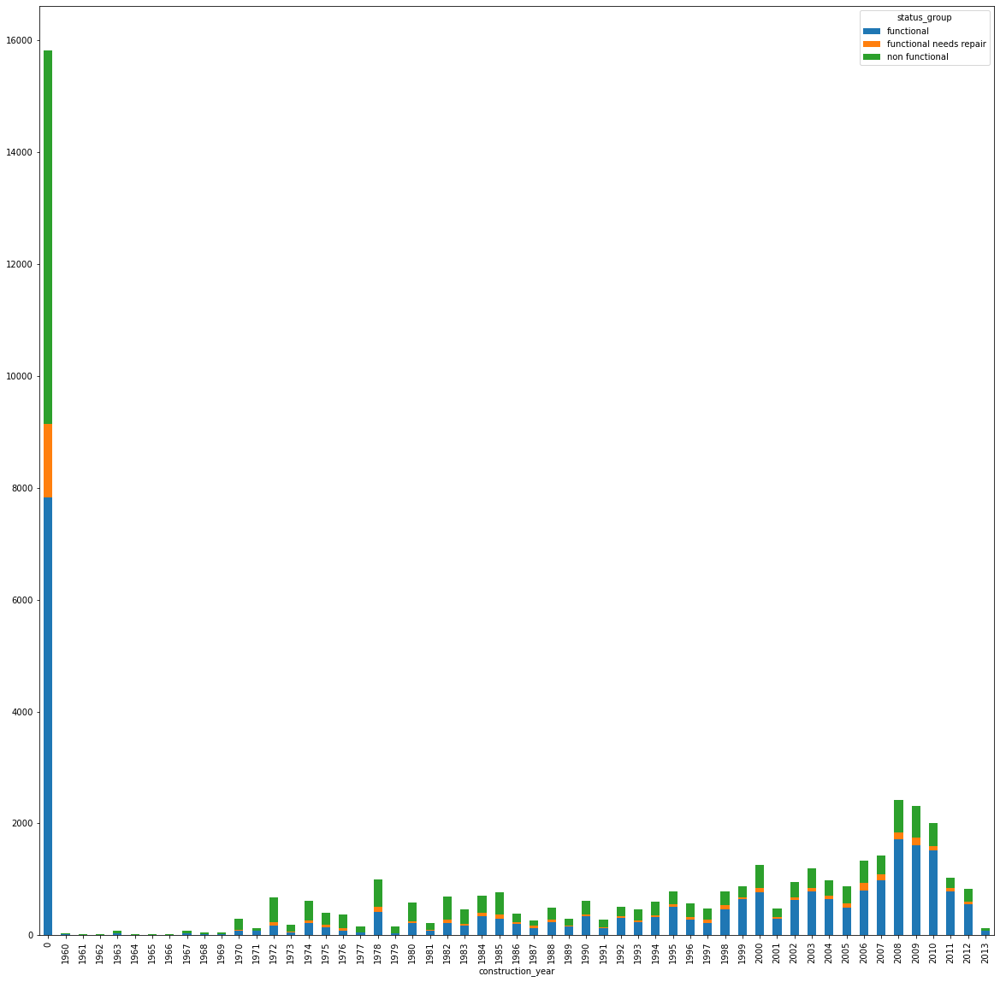

In [12]:
merged_data.groupby(['construction_year','status_group']).size().unstack()[:100].plot(kind='bar', stacked=True,figsize=(20,20))

### by the funder

<AxesSubplot:xlabel='funder'>

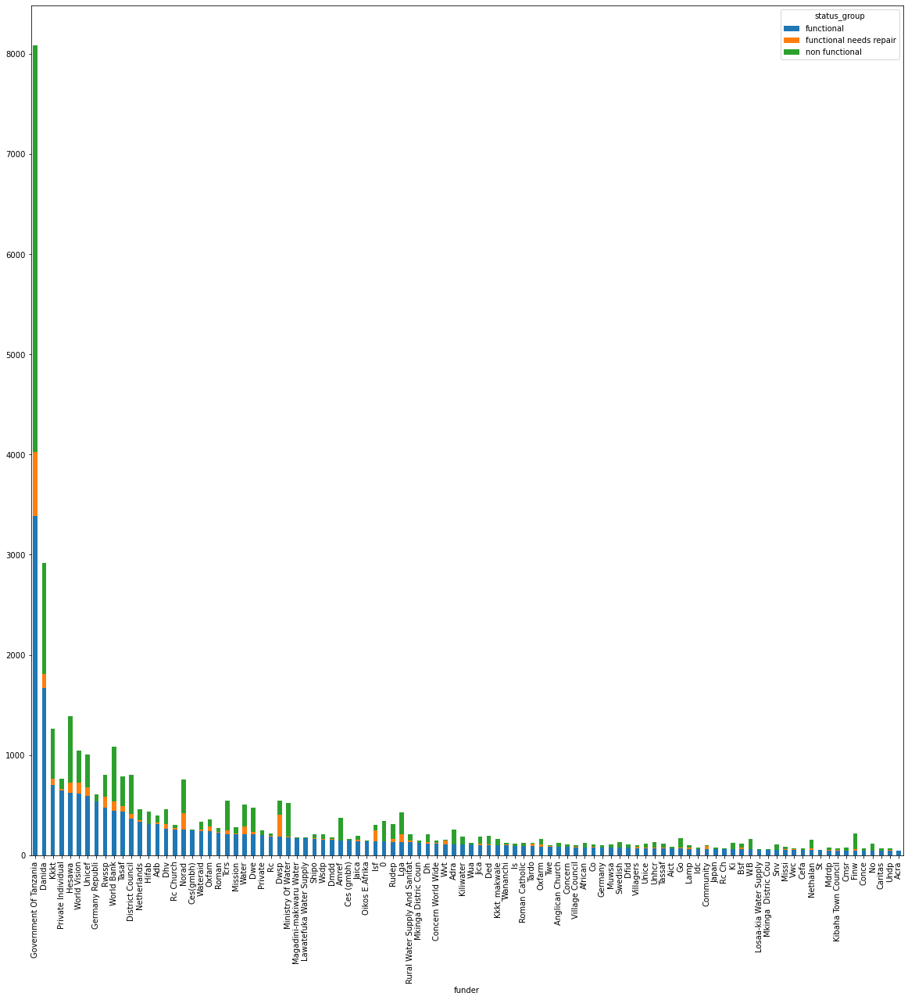

In [13]:
merged_data.groupby(['funder','status_group']).size().unstack().sort_values(by=['functional','non functional'],ascending=False)[:100].plot(kind='bar', stacked=True,figsize=(20,20))

<AxesSubplot:xlabel='funder'>

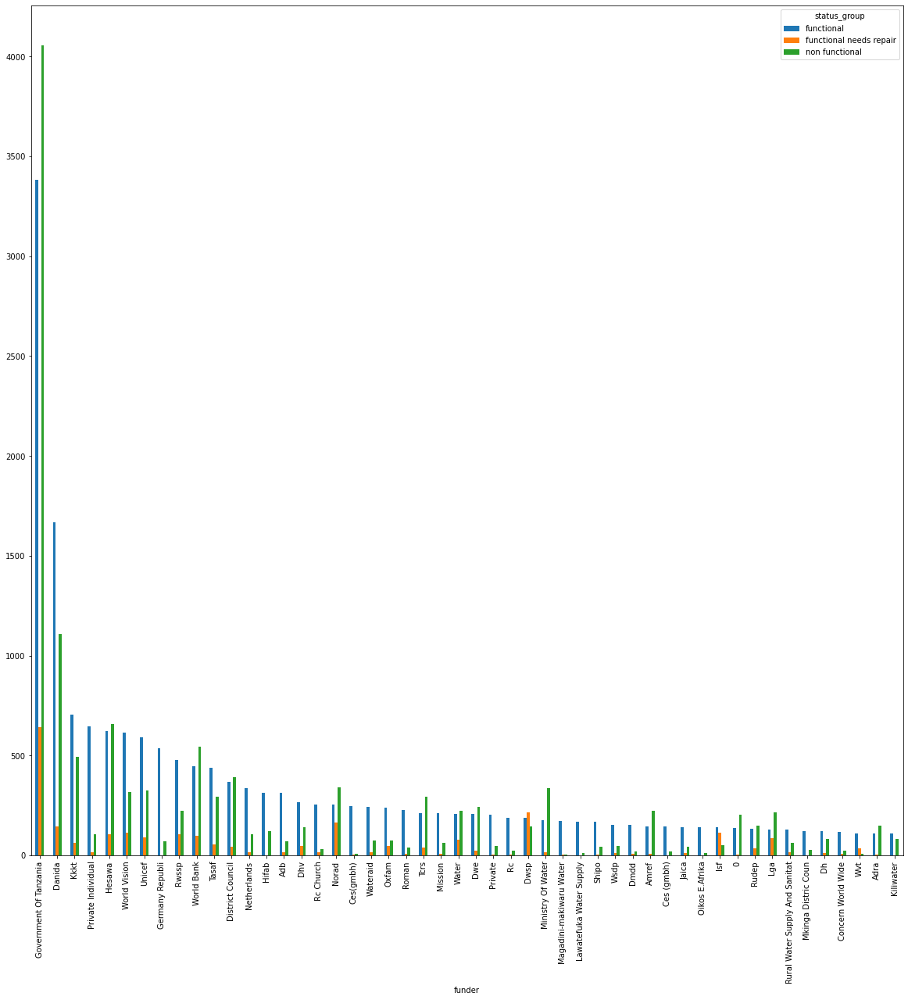

In [14]:
merged_data.groupby(['funder','status_group']).size().unstack().sort_values(by=['functional','non functional'],ascending=False)[:50].plot(kind='bar',figsize=(20,20))

In [15]:
merged_data.groupby(by=['status_group']).count().iloc[:3,:1]

,amount_tsh
status_group,
functional,26517
functional needs repair,3498
non functional,18273


### for loop of box plots

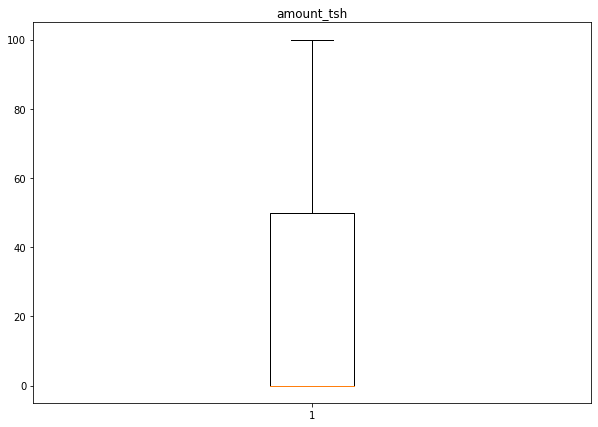

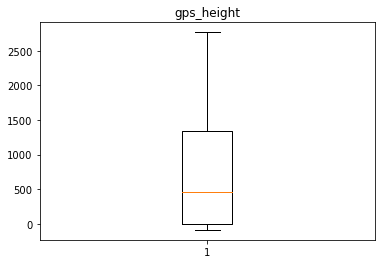

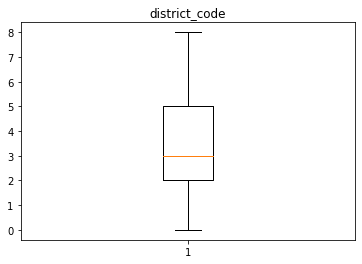

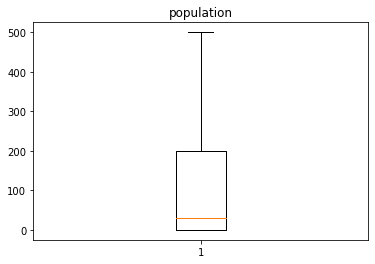

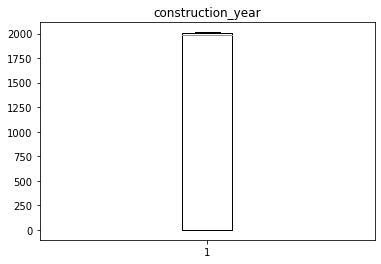

In [16]:
figbox= plt.figure(figsize=(10,7))

for item in numb_col_only:
    plt.boxplot(merged_data[item],showfliers=False)
    plt.title(item)
    plt.show()

getting rid of the outlier in construction year since so many are read as 0 to get a better

<AxesSubplot:>

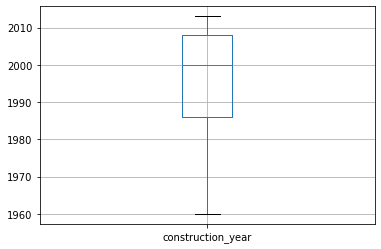

In [17]:
pd.DataFrame(merged_data['construction_year'][merged_data['construction_year']>10]).boxplot()

### for loop of hist plots

amount_tsh


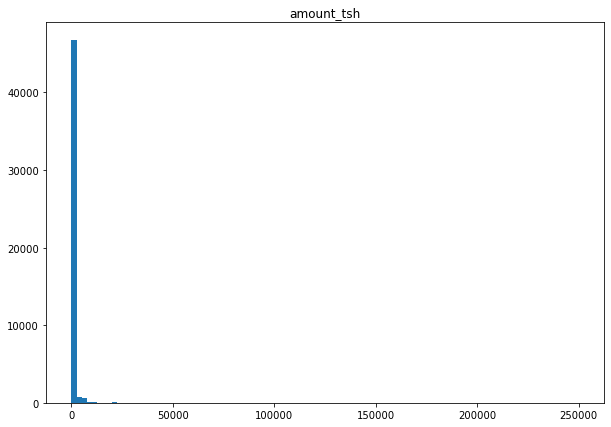

gps_height


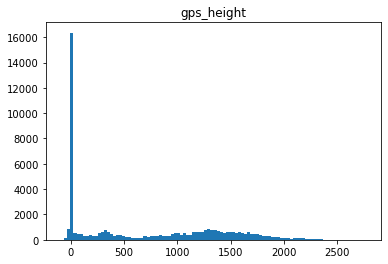

district_code


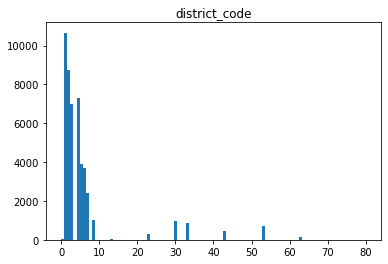

population


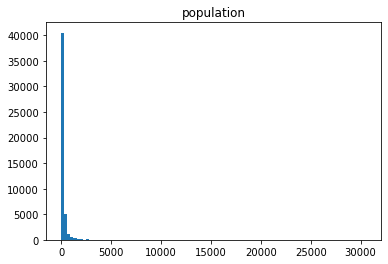

construction_year


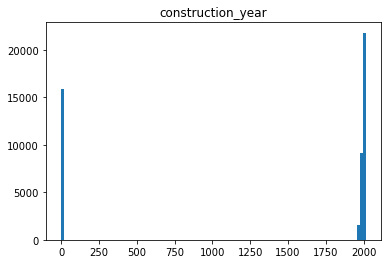

In [18]:

figbox= plt.figure(figsize=(10,7))

for item in numb_col_only:
    print(item)
    plt.hist(start_x[item],bins=100)
    plt.title(item)
    plt.show()

### specific to year

Text(0.5, 1.0, 'construction_year')

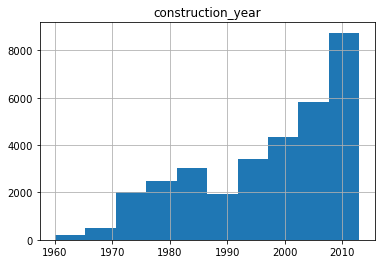

In [19]:
merged_data['construction_year'][merged_data['construction_year']>=10].hist()
plt.title('construction_year')

<AxesSubplot:>

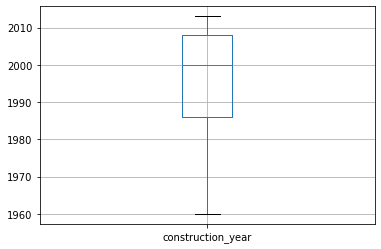

In [20]:
pd.DataFrame(merged_data['construction_year'][merged_data['construction_year']>10]).boxplot()

<AxesSubplot:xlabel='construction_year', ylabel='Count'>

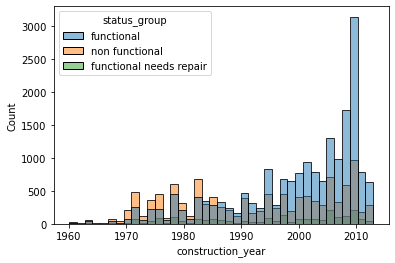

In [21]:
sns.histplot(data=merged_data[merged_data['construction_year']>10],x='construction_year',hue='status_group')

<AxesSubplot:xlabel='installer'>

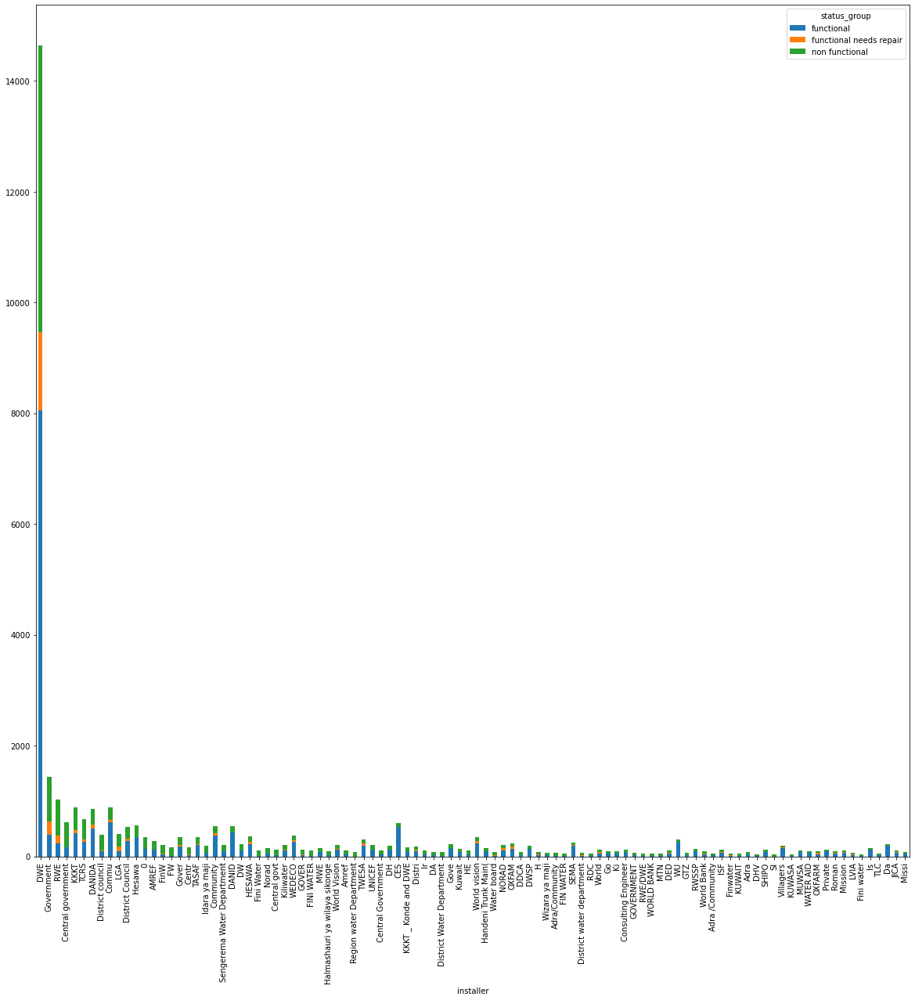

In [22]:
merged_data.groupby(['installer','status_group']).size().unstack().sort_values(by=['non functional','functional'],ascending=False)[:100].plot(kind='bar', stacked=True,figsize=(20,20))

just a count by builder just to see who is responcible for building, can take a better look later for inferance 

a better  look at population data

In [23]:
pd.DataFrame(merged_data['population']).sort_values(by='population',ascending=False).mean()

population    176.683048
dtype: float64

In [24]:
pd.DataFrame(merged_data['population']).sort_values(by='population',ascending=False)[:100]

,population
30537,30500
14308,15300
51398,11463
31363,10000
12784,9865
...,...
40226,5000
40199,5000
14001,5000
27088,5000


In [25]:
pd.DataFrame(merged_data['population']).sort_values(by='population',ascending=False).describe()

,population
count,48288.000000
mean,176.683048
std,472.505399
min,0.000000
25%,0.000000
50%,30.000000
75%,200.000000
max,30500.000000


<AxesSubplot:>

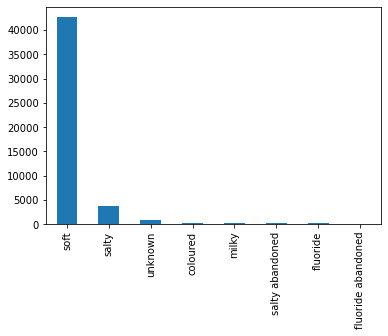

In [26]:
merged_data['water_quality'].value_counts().plot(kind='bar')

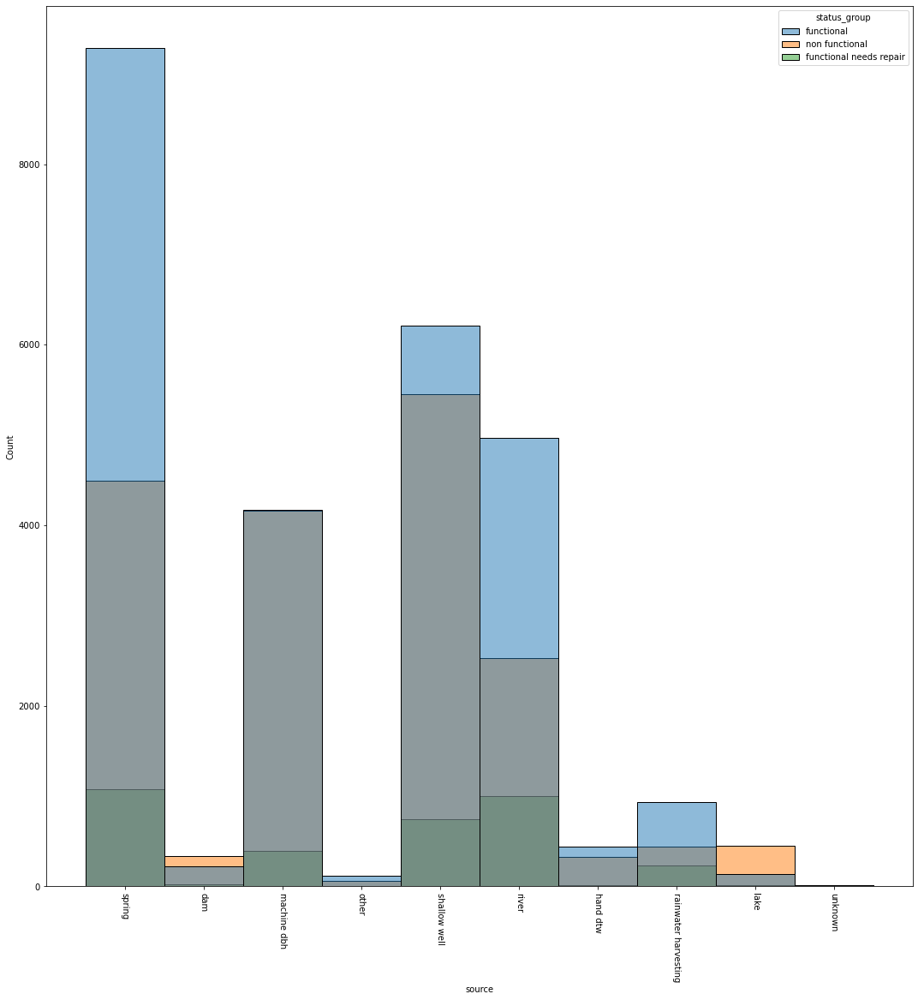

In [27]:
fig = plt.figure(figsize = (15,15))
sns.histplot(data=merged_data,x='source',hue='status_group')
fig.tight_layout()
plt.xticks(rotation='270')
plt.show()

['spring' 'dam' 'machine dbh' 'other' 'shallow well' 'river' 'hand dtw'
 'rainwater harvesting' 'lake' 'unknown']


<AxesSubplot:>

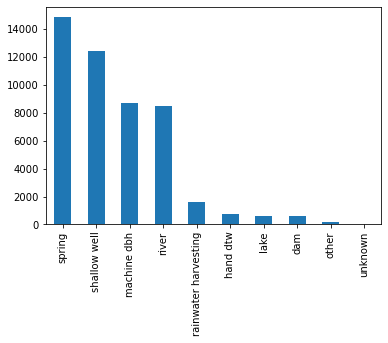

In [28]:
print(merged_data['source'].unique())
merged_data['source'].value_counts().plot(kind='bar')

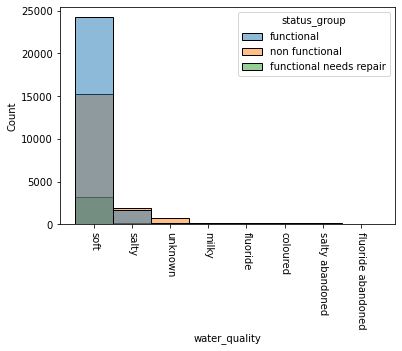

In [29]:
sns.histplot(data=merged_data,x='water_quality',hue='status_group')
fig.tight_layout()
plt.xticks(rotation='270')
plt.show()

# start modeling 

### TRANSFORM DATA

In [30]:
merged_data[merged_data['status_group']!= 'unctional needs repair']

,amount_tsh,funder,gps_height,installer,basin,region,district_code,population,public_meeting,scheme_management,permit,construction_year,extraction_type,management,water_quality,quantity,source,waterpoint_type,status_group
0,6000.0,Roman,1390,Roman,Lake Nyasa,Iringa,5,109,True,VWC,False,1999,gravity,vwc,soft,enough,spring,communal standpipe,functional
2,25.0,Lottery Club,686,World vision,Pangani,Manyara,4,250,True,VWC,True,2009,gravity,vwc,soft,enough,dam,communal standpipe multiple,functional
3,0.0,Unicef,263,UNICEF,Ruvuma / Southern Coast,Mtwara,63,58,True,VWC,True,1986,submersible,vwc,soft,dry,machine dbh,communal standpipe multiple,non functional
5,20.0,Mkinga Distric Coun,0,DWE,Pangani,Tanga,8,1,True,VWC,True,2009,submersible,vwc,salty,enough,other,communal standpipe multiple,functional
6,0.0,Dwsp,0,DWSP,Internal,Shinyanga,3,0,True,VWC,True,0,swn 80,vwc,soft,enough,machine dbh,hand pump,non functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59394,500.0,World Bank,351,ML appro,Wami / Ruvu,Morogoro,6,89,True,VWC,True,2007,submersible,vwc,soft,enough,machine dbh,communal standpipe,non functional
59395,10.0,Germany Republi,1210,CES,Pangani,Kilimanjaro,5,125,True,Water Board,True,1999,gravity,water board,soft,enough,spring,communal standpipe,functional
59396,4700.0,Cefa-njombe,1212,Cefa,Rufiji,Iringa,4,56,True,VWC,True,1996,gravity,vwc,soft,enough,river,communal standpipe,functional
59398,0.0,Malec,0,Musa,Rufiji,Dodoma,4,0,True,VWC,True,0,nira/tanira,vwc,soft,insufficient,shallow well,hand pump,functional


In [31]:
merged_data=merged_data[merged_data['status_group']!= 'functional needs repair']

dummy_data=pd.get_dummies(merged_data, drop_first=True)

dummy_data.head()

,amount_tsh,gps_height,district_code,population,construction_year,funder_A/co Germany,funder_Aar,funder_Abas Ka,funder_Abasia,funder_Abc-ihushi Development Cent,...,source_shallow well,source_spring,source_unknown,waterpoint_type_communal standpipe,waterpoint_type_communal standpipe multiple,waterpoint_type_dam,waterpoint_type_hand pump,waterpoint_type_improved spring,waterpoint_type_other,status_group_non functional
0,6000.0,1390,5,109,1999,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0
2,25.0,686,4,250,2009,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0.0,263,63,58,1986,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
5,20.0,0,8,1,2009,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0.0,0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1


In [32]:
dummy_data.rename(columns={'status_group_non functional':'status_group'},inplace=True)
dummy_data=dummy_data.sample(n=20000, replace=True, random_state=1)

In [33]:
le_x=dummy_data.drop('status_group',axis=1)
le_y=dummy_data['status_group']


X_train, X_test, y_train, y_test = train_test_split(le_x, le_y, test_size=0.25, random_state=50)

In [34]:
scale=StandardScaler()
scaled_data_train = scale.fit_transform(X_train)
scaled_data_test = scale.transform(X_test)

scaled_data_train = pd.DataFrame(scaled_data_train, columns=le_x.columns)
scaled_data_train.head()

,amount_tsh,gps_height,district_code,population,construction_year,funder_A/co Germany,funder_Aar,funder_Abas Ka,funder_Abasia,funder_Abc-ihushi Development Cent,...,source_river,source_shallow well,source_spring,source_unknown,waterpoint_type_communal standpipe,waterpoint_type_communal standpipe multiple,waterpoint_type_dam,waterpoint_type_hand pump,waterpoint_type_improved spring,waterpoint_type_other
0,-0.106621,0.710687,-0.186445,-0.371936,0.661758,-0.014144,-0.0231,0.0,-0.028296,0.0,...,-0.450323,-0.594187,1.499152,-0.020004,-0.981897,-0.351083,-0.008165,-0.632588,-0.107385,2.987842
1,-0.027519,0.941542,-0.083626,-0.234871,0.684298,-0.014144,-0.0231,0.0,-0.028296,0.0,...,-0.450323,-0.594187,1.499152,-0.020004,1.018437,-0.351083,-0.008165,-0.632588,-0.107385,-0.334690
2,-0.106621,0.770171,-0.186445,0.754564,0.700398,-0.014144,-0.0231,0.0,-0.028296,0.0,...,-0.450323,-0.594187,-0.667044,-0.020004,1.018437,-0.351083,-0.008165,-0.632588,-0.107385,-0.334690
3,-0.106621,1.974018,-0.186445,-0.309828,0.698251,-0.014144,-0.0231,0.0,-0.028296,0.0,...,-0.450323,-0.594187,1.499152,-0.020004,1.018437,-0.351083,-0.008165,-0.632588,-0.107385,-0.334690
4,-0.106621,1.750244,-0.392084,-0.052832,0.686444,-0.014144,-0.0231,0.0,-0.028296,0.0,...,-0.450323,-0.594187,1.499152,-0.020004,1.018437,-0.351083,-0.008165,-0.632588,-0.107385,-0.334690


In [35]:
knn_base=KNeighborsClassifier()
tree_base=tree.DecisionTreeClassifier()
random_base=RandomForestClassifier(n_estimators=500, max_depth= 50)
log_base=LogisticRegression(fit_intercept=False, C=1e12, solver='liblinear')
xboost_base=XGBClassifier()
listofmodels=[knn_base,tree_base,log_base]

              precision    recall  f1-score   support

           0       0.84      0.92      0.88      9006
           1       0.86      0.74      0.79      5994

    accuracy                           0.85     15000
   macro avg       0.85      0.83      0.84     15000
weighted avg       0.85      0.85      0.84     15000

              precision    recall  f1-score   support

           0       0.81      0.89      0.85      2981
           1       0.80      0.69      0.74      2019

    accuracy                           0.81      5000
   macro avg       0.81      0.79      0.79      5000
weighted avg       0.81      0.81      0.80      5000


AUC is :0.79


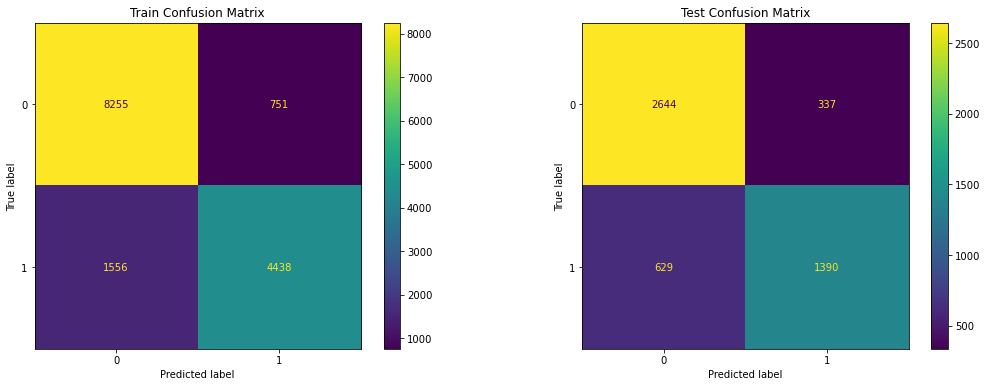

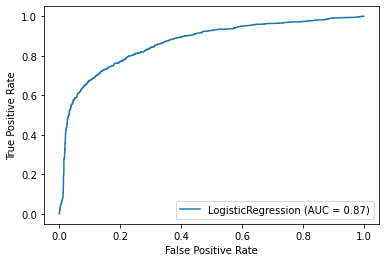

LogisticRegression(C=1000000000000.0, fit_intercept=False, solver='liblinear')

In [36]:
run_model(log_base,scaled_data_train, y_train, scaled_data_test, y_test)

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      9006
           1       0.99      0.96      0.97      5994

    accuracy                           0.98     15000
   macro avg       0.98      0.98      0.98     15000
weighted avg       0.98      0.98      0.98     15000

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      2981
           1       0.82      0.77      0.80      2019

    accuracy                           0.84      5000
   macro avg       0.84      0.83      0.83      5000
weighted avg       0.84      0.84      0.84      5000



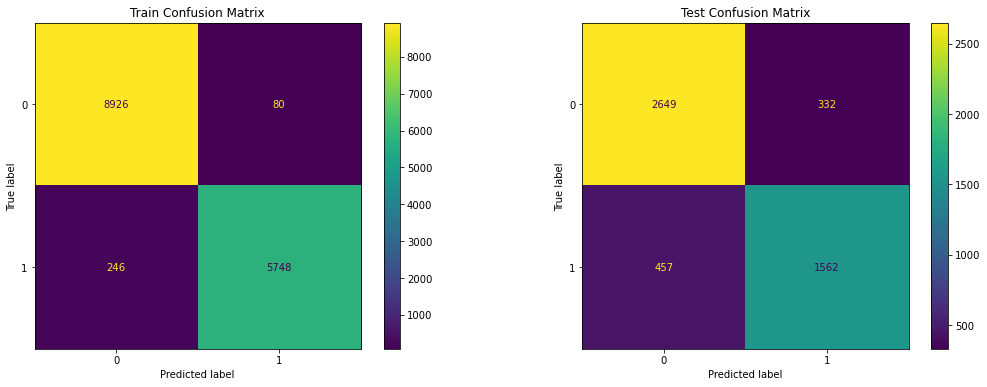

DecisionTreeClassifier()

In [37]:
run_model(tree_base,scaled_data_train, y_train, scaled_data_test, y_test)

              precision    recall  f1-score   support

           0       0.86      0.90      0.88      9006
           1       0.84      0.78      0.81      5994

    accuracy                           0.85     15000
   macro avg       0.85      0.84      0.85     15000
weighted avg       0.85      0.85      0.85     15000

              precision    recall  f1-score   support

           0       0.81      0.85      0.83      2981
           1       0.76      0.70      0.73      2019

    accuracy                           0.79      5000
   macro avg       0.78      0.77      0.78      5000
weighted avg       0.79      0.79      0.79      5000


AUC is :0.77


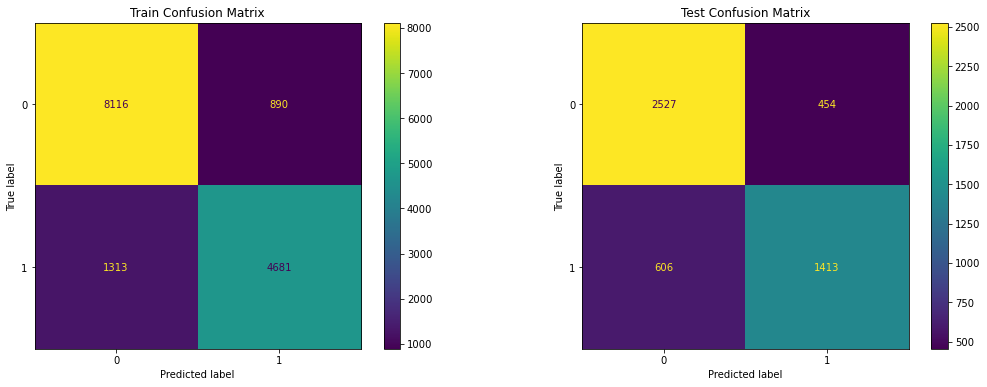

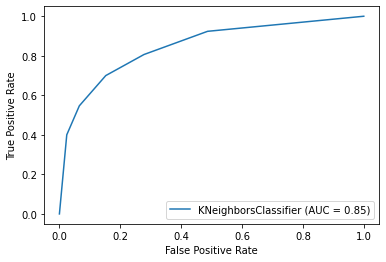

KNeighborsClassifier()

In [38]:
run_model(knn_base,scaled_data_train, y_train, scaled_data_test, y_test)

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      9006
           1       0.98      0.96      0.97      5994

    accuracy                           0.98     15000
   macro avg       0.98      0.97      0.98     15000
weighted avg       0.98      0.98      0.98     15000

              precision    recall  f1-score   support

           0       0.85      0.92      0.89      2981
           1       0.87      0.77      0.81      2019

    accuracy                           0.86      5000
   macro avg       0.86      0.84      0.85      5000
weighted avg       0.86      0.86      0.86      5000


AUC is :0.84


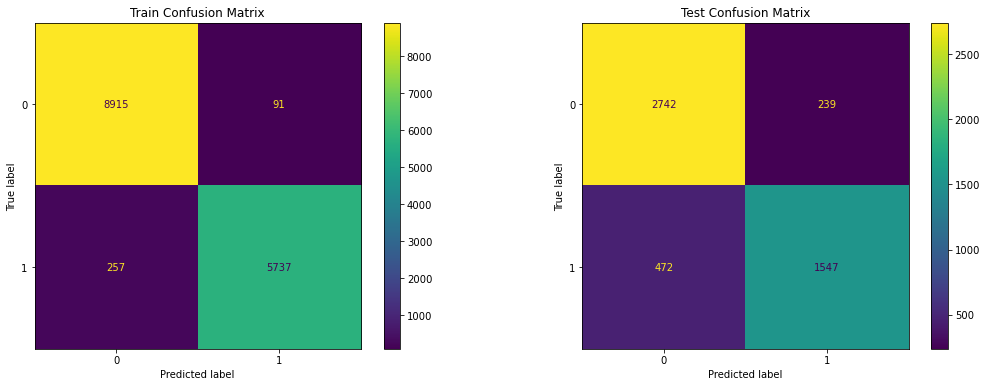

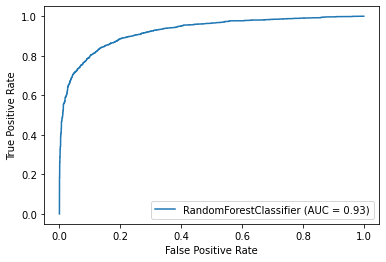

RandomForestClassifier(max_depth=50, n_estimators=500)

In [39]:
run_model(random_base,scaled_data_train, y_train, scaled_data_test, y_test)

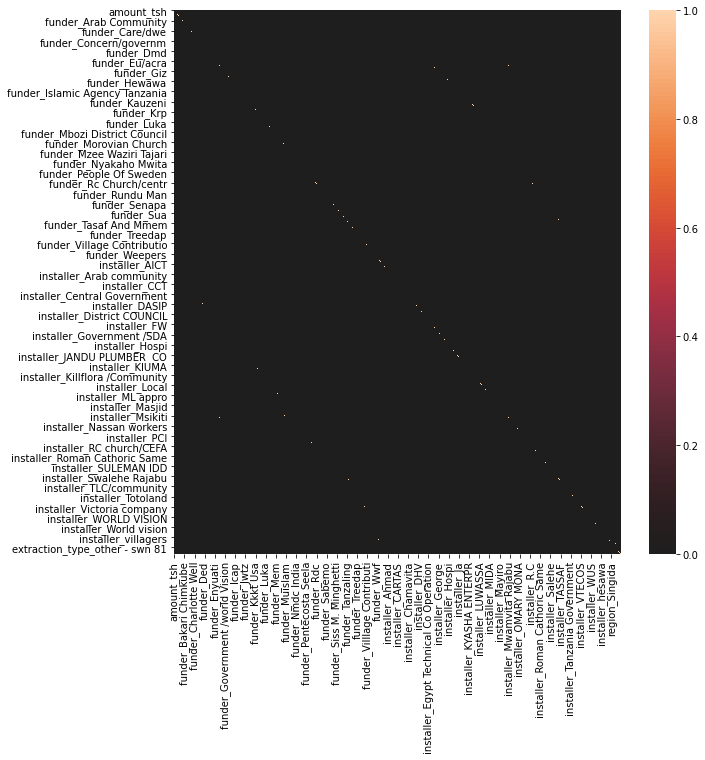

In [40]:
fig,hs = plt.subplots(figsize=(10,10))
sns.heatmap(scaled_data_train.corr()>.75, center=0);


C:\Users\amird\Anaconda3\envs\learn-env\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:45:32] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

           0       0.86      0.95      0.91      9006
           1       0.92      0.78      0.84      5994

    accuracy                           0.88     15000
   macro avg       0.89      0.86      0.87     15000
weighted avg       0.89      0.88      0.88     15000

              precision    recall  f1-score   support

           0       0.82      0.93      0.87      2981
           1       0.87      0.70      0.78      2019

    accuracy                           0.84      5000
   macro avg       0.85      0.82      0.83      5000
weighted avg       0.84      0.84      0.83      5000


AUC is :0.82


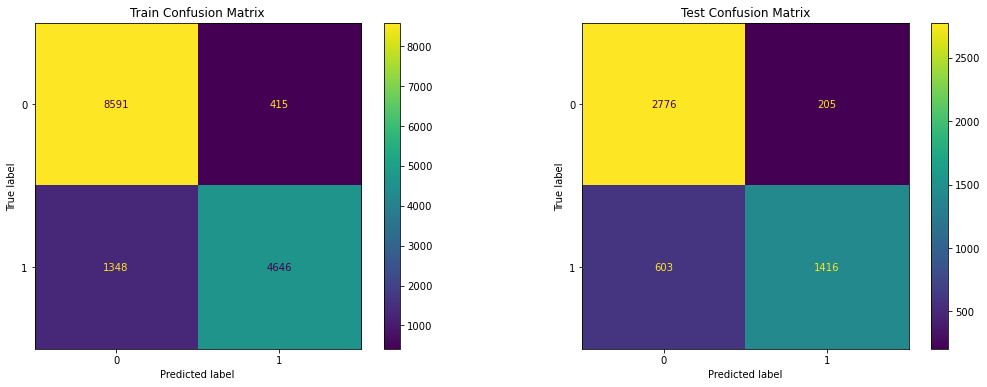

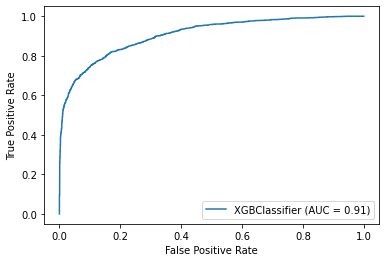

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [41]:
import re
regex = re.compile(r"\[|\]|<", re.IGNORECASE)
scaled_data_train.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in scaled_data_train.columns.values]



run_model(xboost_base,scaled_data_train.values, y_train, scaled_data_test, y_test)

pickle your data to make thing s easier, to rerun, I will not save storage files in this cleaned version

two of the best models seems to be random forest and basic decision tree modeling but i may also do xgboost to see if we get a good result from it

### grid search

In [42]:
dict_random= {
    "n_estimators":[100,500,90,80,600],
    "criterion":['gini','entropy'],
#     "max_depth":[40,50,60,70,80],
    'min_samples_split':[4,5,6,10],
#     "min_samples_leaf":[2,3,4,5,6]
}


xgboostoh={
    'n_estimators':[100,200,300],
    "gamma":[0,1,2,3,4],
    "base_score ":[.3,.5,.6],
#     "importance_type":['weight','gain','cover']
#     "max_depth":[1,2,4,6,7],
#     "grow_policy":["depthwise",'lossguide']
    
}

In [43]:

boost_grid = GridSearchCV(xboost_base, xgboostoh, cv=4, return_train_score=True)

boost_grid.fit(scaled_data_train.values, y_train)

C:\Users\amird\Anaconda3\envs\learn-env\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:48:13] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:48:15] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[14:50:09] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:50:11] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default eva

[15:26:34] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:27:54] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:27:55] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:29:17] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in langua

[16:03:31] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:03:32] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[16:06:11] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:06:13] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default eva

[17:51:37] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:54:52] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:54:54] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:59:00] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in langua

[18:33:38] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[18:33:39] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[18:37:27] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[18:37:28] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default eva

[19:12:07] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:13:24] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:13:26] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:14:43] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in langua

[19:46:32] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:46:33] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:47:50] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:47:51] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default eva

[20:21:20] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:23:54] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:23:55] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:26:29] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in langua

[20:59:40] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:59:41] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:03:29] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:03:30] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default eva

[21:38:28] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:42:15] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:42:16] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:46:03] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in langua

[22:18:01] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:18:02] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:19:19] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:19:21] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default eva

[22:51:53] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:53:13] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:53:14] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:55:50] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in langua

[23:29:42] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:29:44] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:32:20] WARNING: ..\src\learner.cc:541: 
Parameters: { base_score  } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:32:22] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default eva

GridSearchCV(cv=4,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0, gpu_id=-1,
                                     importance_type='gain',
                                     interaction_constraints='',
                                     learning_rate=0.300000012,
                                     max_delta_step=0, max_depth=6,
                                     min_child_weight=1, missing=nan,
                                     monotone_constraints='()',
                                     n_estimators=100, n_jobs=4,
                                     num_parallel_tree=1, random_state=0,
                                     reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, subsample=1,
                                     tree_method='exact', validate_parameters=1,
         

In [44]:
boost_grid.best_score_

0.8478666666666667

In [45]:
boost_grid.best_estimator_

XGBClassifier(base_score=0.5, base_score =0.3, booster='gbtree',
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=300, n_jobs=4,
              num_parallel_tree=1, random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [46]:
boost_grid.best_params_

{'base_score ': 0.3, 'gamma': 0, 'n_estimators': 300}

In [47]:
boost_grid.score(scaled_data_test, y_test)


0.8524

In [48]:
random_grid = GridSearchCV(RandomForestClassifier(), dict_random, cv=2, return_train_score=True)
random_grid.fit(scaled_data_train, y_train)

GridSearchCV(cv=2, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'min_samples_split': [4, 5, 6, 10],
                         'n_estimators': [100, 500, 90, 80, 600]},
             return_train_score=True)

In [49]:
newboost=XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eta=0.3, gamma=0,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

C:\Users\amird\Anaconda3\envs\learn-env\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:42:29] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

           0       0.86      0.95      0.91      9006
           1       0.92      0.78      0.84      5994

    accuracy                           0.88     15000
   macro avg       0.89      0.86      0.87     15000
weighted avg       0.89      0.88      0.88     15000

              precision    recall  f1-score   support

           0       0.82      0.93      0.87      2981
           1       0.87      0.70      0.78      2019

    accuracy                           0.84      5000
   macro avg       0.85      0.82      0.83      5000
weighted avg       0.84      0.84      0.83      5000


AUC is :0.82


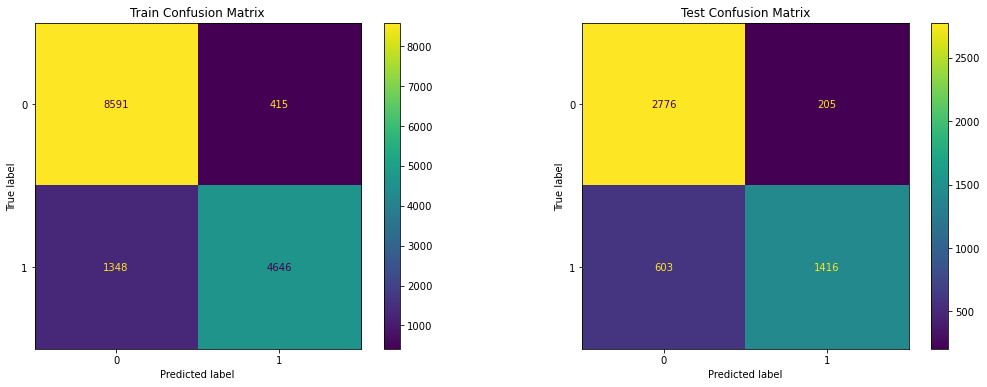

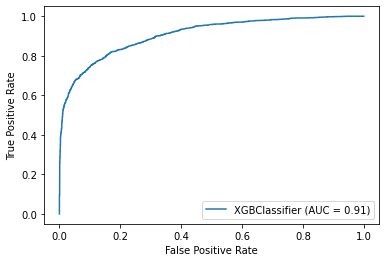

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eta=0.3, gamma=0,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [50]:
run_model(newboost,scaled_data_train.values, y_train, scaled_data_test, y_test)

In [51]:
 random_grid.best_score_

0.8382000000000001

In [52]:
random_grid.best_estimator_

RandomForestClassifier(min_samples_split=4, n_estimators=600)

              precision    recall  f1-score   support

           0       0.95      0.98      0.96      9006
           1       0.96      0.93      0.94      5994

    accuracy                           0.96     15000
   macro avg       0.96      0.95      0.95     15000
weighted avg       0.96      0.96      0.96     15000

              precision    recall  f1-score   support

           0       0.85      0.92      0.88      2981
           1       0.86      0.77      0.81      2019

    accuracy                           0.86      5000
   macro avg       0.86      0.84      0.85      5000
weighted avg       0.86      0.86      0.85      5000


AUC is :0.84


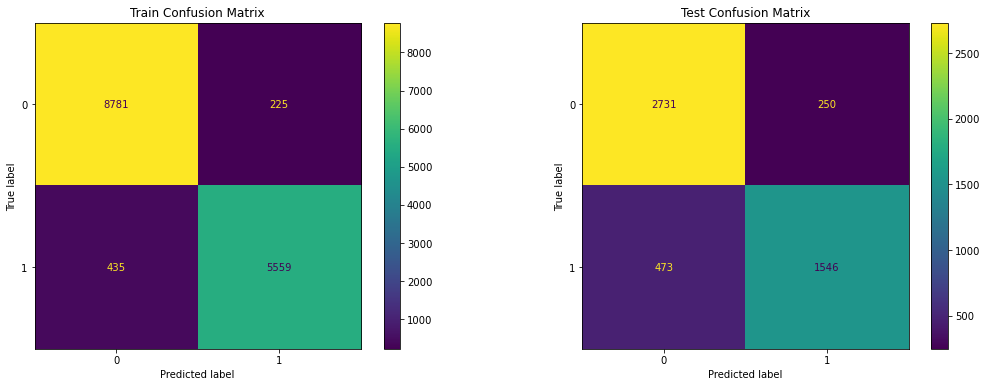

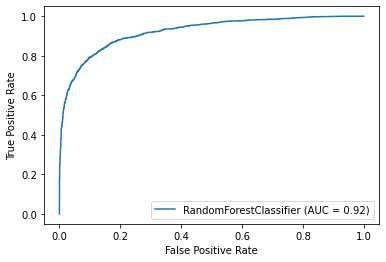

RandomForestClassifier(criterion='entropy', min_samples_split=5,
                       n_estimators=500)

In [54]:
last_random=RandomForestClassifier(criterion='entropy', n_estimators=500, min_samples_split=5)

run_model(last_random,scaled_data_train, y_train, scaled_data_test, y_test)

In [55]:
last_random.feature_importances_

array([0.03877528, 0.0797041 , 0.03023201, ..., 0.01235276, 0.00214583,
       0.03047998])

In [56]:
len(last_random.feature_importances_)

3381

In [58]:
wat=last_random.feature_importances_.argsort()

<BarContainer object of 20 artists>

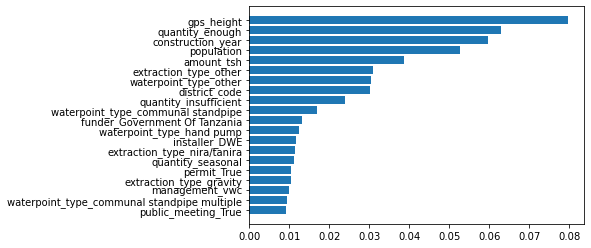

In [59]:
plt.barh(scaled_data_train.columns[wat][-20:], last_random.feature_importances_[wat][-20:])

<AxesSubplot:xlabel='gps_height', ylabel='Count'>

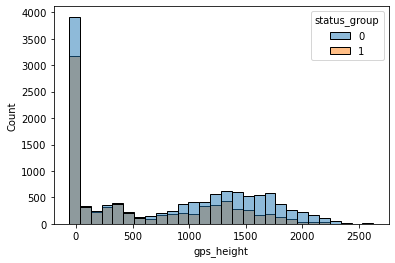

In [60]:
sns.histplot(data=dummy_data,x='gps_height',hue='status_group')

<AxesSubplot:xlabel='quantity_enough', ylabel='Count'>

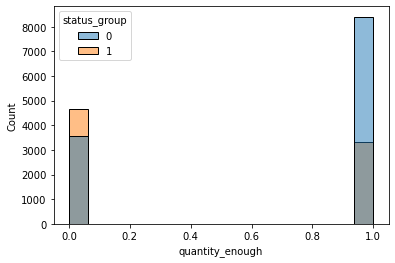

In [61]:
sns.histplot(data=dummy_data,x='quantity_enough',hue='status_group')

<AxesSubplot:xlabel='amount_tsh', ylabel='status_group'>

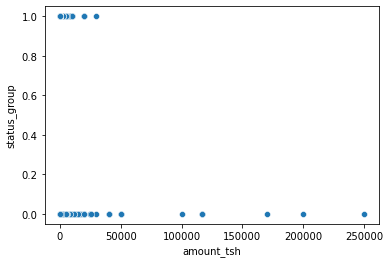

In [62]:
sns.scatterplot(data=dummy_data,x='amount_tsh',y='status_group')

In [63]:
dat=merged_data.groupby(['population','status_group']).size().unstack().sort_values(by=['non functional','functional'],ascending=False)#.plot(kind='line')#, stacked=True,figsize=(20,20))